# Transects in ACCESS-CM3 and ACCESS-OM3

Transects of 1993-2017 mean potential temperature and salinity near WOCE/GO-SHIP hydrographic lines, compared to climatologies (1985-2013) from WOA23.

Based on in Figs 14, 20, 23, 25 of [Kiss et al 2020](https://doi.org/10.5194/gmd-13-401-2020) - see code [here](https://github.com/COSIMA/ACCESS-OM2-1-025-010deg-report/blob/master/figures/WOCE_transects/Plot_WOCE_transects.ipynb).

- SR3 (Fig 14)
- P16 (Fig 20)
- A16 (Fig 23)
- IO8, IO9 (Fig 25)

Related issue:
- https://github.com/ACCESS-Community-Hub/access-om3-paper-1/issues/13

In [1]:
# parameters
# These first two cells must be in all notebooks!
# It allows us to run all the notebooks at once, this cell has a tag "parameters" which allows us to pass in 
# arguments externally using papermill (see mkfigs.sh for details)

# Set esm_file to the datastore for the main experiment of interest
# esm_file = "/g/data/ol01/outputs/access-om3-25km/25km-iaf-test-for-AK-expt-7df5ef4c/datastore.json"
# esm_file = "/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-5165c0f8/datastore.json"
# esm_file = "/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf+wombatlite-test3v2-00532b88/datastore.json"
# esm_file = "/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf+wombatlite-test4-d28e0359/datastore.json"
esm_file = "/g/data/zv30/non-cmip/ACCESS-CM3/cm3-run-27-07-2026-PD-control/cm3-datastore/cm3-datastore.json"


In [2]:
import intake
from dask.distributed import Client
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
import cmocean
import cartopy.crs as ccrs
import cftime
import cf_xarray as cfxr
import cf_xarray.units
import numpy as np
import xarray as xr
import os

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [4]:
client = Client(threads_per_worker=1)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 14
Total threads: 14,Total memory: 63.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36137,Workers: 0
Dashboard: /proxy/8787/status,Total threads: 0
Started: Just now,Total memory: 0 B
Comm: tcp://127.0.0.1:38781,Total threads: 1
Dashboard: /proxy/45111/status,Memory: 4.50 GiB
Nanny: tcp://127.0.0.1:44155,


## Load ACCESS-CM3 data from ESM datastore

In [5]:
catalogs = [esm_file]

In [6]:
cm3datastores = { os.path.normpath(c).split(os.sep)[-3]:
               intake.open_esm_datastore(c,
                                         columns_with_iterables=[
                                            "variable",
                                            "variable_long_name",
                                            "variable_standard_name",
                                            "variable_cell_methods",
                                            "variable_units"]
                                        )
              for c in catalogs }
cm3datastores

{'cm3-run-27-07-2026-PD-control': <cm3-datastore catalog with 22 dataset(s) from 7000 asset(s)>}

In [7]:
cm3exptname = os.path.basename(os.path.dirname(os.path.dirname(esm_file)))
cm3exptname

'cm3-run-27-07-2026-PD-control'

In [8]:
varnames = [ 'thetao', 'so' ]  # potential temperature and practical salinity

cm3chunks = {"time": 12, "z_l": "auto", "yh": "auto", "xh": "auto"}

cm3data = {
            expt: ds.search(variable=varnames).to_dask(
                xarray_open_kwargs = dict(
                    chunks=cm3chunks,
                    decode_timedelta=True
                )
            )
            for expt, ds in cm3datastores.items()
          }

for expt, ds in cm3data.items():
    try:
        cm3data[expt] = ds.convert_calendar("proleptic_gregorian", use_cftime=True)
    except KeyError:
        pass

cm3mask = np.isfinite(cm3data[cm3exptname][varnames[0]].isel(time=0)).load()

## Load ACCESS-OM3 data from ESM datastore

In [9]:
om3_catalogs = ['/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf+wombatlite-test3v2-00532b88/datastore.json']

om3datastores = { os.path.normpath(c).split(os.sep)[-2]:
               intake.open_esm_datastore(c,
                                         columns_with_iterables=[
                                            "variable",
                                            "variable_long_name",
                                            "variable_standard_name",
                                            "variable_cell_methods",
                                            "variable_units"]
                                        )
              for c in om3_catalogs }

In [10]:
om3exptname = os.path.basename(os.path.dirname(om3_catalogs[0]))
om3exptname

'MC_25km_jra_iaf+wombatlite-test3v2-00532b88'

In [11]:
om3chunks = {"time": -1}

om3data = {
            expt: ds.search(variable=varnames).to_dask(
                xarray_open_kwargs = dict(
                    chunks=om3chunks,
                    decode_timedelta=True
                )
            )
            for expt, ds in om3datastores.items()
          }

for expt, ds in om3data.items():
    try:
        om3data[expt] = ds.convert_calendar("proleptic_gregorian", use_cftime=True)
    except KeyError:
        pass

om3mask = np.isfinite(om3data[om3exptname][varnames[0]].isel(time=0)).load()

## Set time range and calculate time average

In [12]:
lasttime = []
for expt, ds in list(om3data.items()) + list(cm3data.items()):
    lasttime.append(ds.time.values[-1])
    
for expt, ds in om3data.items():

    # datestop = cftime.DatetimeProlepticGregorian(2018, 12, 31, 12, 0, 0, 0, has_year_zero=True)  # to match OM2 IAF run
    datestop = min(lasttime) # earliest final date in data
    datelist = list(cftime.to_tuple(datestop))
    datelist[0] -= 10-1  # last 10 years
    datestart = cftime.datetime(*datelist, calendar=datestop.calendar)
    # bracket to start/end of year
    datestart = cftime.datetime(cftime.to_tuple(datestart)[0],  1, 1, calendar=datestop.calendar)
    datestop  = cftime.datetime(cftime.to_tuple(datestop)[0], 12, 31, 23, 59, 59, calendar=datestop.calendar)
    timerange = slice(datestart, datestop)


# timerange = slice(None, None) # all times

timerange

slice(cftime.datetime(2014, 1, 1, 0, 0, 0, 0, calendar='proleptic_gregorian', has_year_zero=True), cftime.datetime(2023, 12, 31, 23, 59, 59, 0, calendar='proleptic_gregorian', has_year_zero=True), None)

In [13]:
%%time
for expt, ds in cm3data.items():
    cm3data[expt] = ds.sel(time=timerange).mean('time').load()

CPU times: user 2min, sys: 1min 20s, total: 3min 21s
Wall time: 11min 21s


In [14]:
%%time
for expt, ds in om3data.items():
    om3data[expt] = ds.sel(time=timerange).mean('time').load()

CPU times: user 30.9 s, sys: 22.2 s, total: 53 s
Wall time: 2min 23s


## Define transect locations
Compare to the [GO-SHIP transects](http://www.go-ship.org/RefSecs/go-ship_floating_status.png) - note that most of them are not purely zonal or meridional!

/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/argopy/utils/lists.py:38: UserWarning: An error occurred while loading the ERDDAP data fetcher, it will not be available !
<class 'ImportError'>
cannot import name '_quote_string_constraints' from 'erddapy.erddapy' (/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/erddapy/erddapy.py)
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/argopy/utils/lists.py:50: UserWarning: An error occurred while loading the ArgoVis data fetcher, it will not be available !
<class 'ImportError'>
cannot import name '_quote_string_constraints' from 'erddapy.erddapy' (/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/erddapy/erddapy.py)
  warnings.warn(
/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/argopy/utils/lists.py:66: UserWarning: An error occurred while loadi

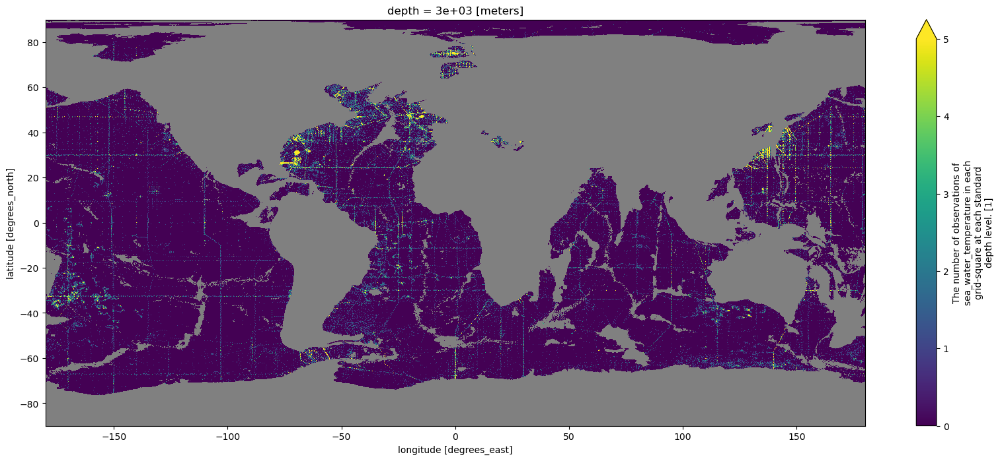

In [15]:
# Example: number of T obs underlying WAO23 at 3000m depth.
# Using seasonal decav data, which extends full depth.
# NB: use mean instead of sum so that land is nan, and then multiply by 4 to get sum.
woa23_obs = 4.0 * xr.open_mfdataset('/g/data/av17/access-nri/OM3/woa23/woa23_decav_t1[3-6]_04.nc',
                 decode_times=False).mean('time').sel(depth=3000, method='nearest').t_dd.load()

plt.figure(figsize=(20, 8))
woa23_obs.plot(vmax=5)
plt.gca().set_facecolor('gray')  # gray land points

{'SR3': [-219.875, -219.875, -67, -42],
 'P16': [-149.875, -149.875, -76, 61],
 'A16': [-24.875, -24.875, -75.01, 65],
 'I08-09': [-264.875, -264.875, -65, 15.1],
 'P02': [-237, -117, 30.02344512939453, 30.02344512939453],
 'P04': [-235, -85, 9.456768035888672, 9.456768035888672],
 'P06': [-207, -72, -32.58631896972656, -32.58631896972656],
 'OSNAP': [-62, -5, 59.007381439208984, 59.007381439208984],
 'A02': [-52, -5, 47.92713928222656, 47.92713928222656],
 'A05': [-96, -17, 24.47026252746582, 24.47026252746582],
 'A10': [-50, 17, -30.02344512939453, -30.02344512939453],
 'Mediterranean outflow': [-75, -6, 36.094486236572266, 36.094486236572266],
 'I05 west': [29, 80, -33.006614685058594, -33.006614685058594],
 'I05 east': [-280, -246, -33.006614685058594, -33.006614685058594]}

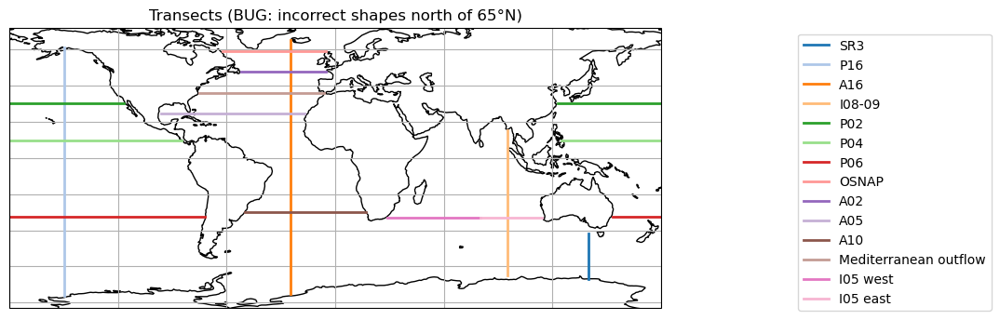

In [16]:
# Transects: [minlon, maxlon, minlat, maxlat]
# Add as many as you like, but they must be zonal or meridional
transects = {
    'SR3': [140-360, 140-360, -67, -42], # to match Kiss et al 2020
    'P16': [-150, -150, -76, 61], # to match Kiss et al 2020
    'A16': [-25, -25, -75.01, 65], # to match Kiss et al 2020
    'I08-09': [95-360, 95-360, -65, 15.1], # to match Kiss et al 2020
    'P02': [ -237, -117, 30, 30],
    'P04': [ -235, -85, 9.5, 9.5],
    'P06': [ -207, -72, -32.5, -32.5],
    'OSNAP': [-62, -5, 59, 59], # only roughly near OSNAP
    'A02': [-52, -5, 48, 48], # only roughly near A02
    'A05': [-96, -17, 24.5, 24.5],
    'A10': [-50, 17, -30, -30],
    'Mediterranean outflow': [-75, -6, 36, 36],
    'I05 west': [29, 80, -33, -33],
    'I05 east': [-280, -246, -33, -33],
}

for transect, (minlon, maxlon, minlat, maxlat) in transects.items():
    if (minlon != maxlon) and (minlat != maxlat):
        raise ValueError(f'Error in {model} {transect}: Must have either minlon == maxlon or minlat == maxlat')

transects = {k: dict(zip(["minx", "maxx", "miny", "maxy"], v)) for k, v in transects.items()}  # convert to dicts

for r, d in transects.items():
    for k, x in d.items():
        if k in ["minx", "maxx"] and x != max(-280, min(x, 80)):
            raise ValueError(f"{r} {k} = {x} is outside the range -280 to 80")
        if k in ["miny", "maxy"] and x > 65:
            print(f"{r} {k} changed from {x} to 65 to omit tripolar region")
            d[k] = 65
 
# Quantise OM3 transect locations to relevant grid
for transect, d in transects.items():
    if d['minx'] == d['maxx']:
        d['minx'] = d['maxx'] = om3data[om3exptname].sel(xh=d['minx'], method='nearest').xh.values.tolist()
    elif d['miny'] == d['maxy']:
        d['miny'] = d['maxy'] = om3data[om3exptname].sel(yh=d['miny'], method='nearest').yh.values.tolist()


# revert to array for coords
transects = {k: list(d.values()) for k, d in transects.items()}

fig = plt.figure(figsize=(10, 4))

colors = mpl.color_sequences['tab20']

ax = plt.axes(position=[0.05,0.05,0.7,0.9], projection=ccrs.PlateCarree())
ax.coastlines(resolution="110m")
ax.gridlines(draw_labels=False)

legend_elements = []
for i, (transect, (minlon, maxlon, minlat, maxlat)) in enumerate(transects.items()):
    plt.plot([minlon, maxlon], [minlat, maxlat],
             color=colors[i],
             linewidth=2,
             transform=ccrs.PlateCarree(),
             label=transect)

plt.legend(bbox_to_anchor=(1.2, 1.00))
plt.title("Transects (BUG: incorrect shapes north of 65°N)")

transects

## Load data from WOA

NB: we're taking a mean of the monthly means. This reduces seasonal bias relative to the annual mean WOA (I think!), but will also involve more interpolated values.

The alternative would be to use the WOA annual mean `/g/data/ik11/observations/woa23/woa23_decav_[ts]00_04.nc` but this needs to be converted to the appropriate temperature and salinity, and regridded to model grid.


In [17]:
obsdata = dict()

### WOA23 for comparison to OM3

In [18]:
# fragile! obs_file_pattern depends on model run!
# obs_file_pattern = "/g/data/ik11/inputs/access-om3/woa23/025/2025.10.24/woa23_ts_*"
obs_file_pattern = "/g/data/ik11/inputs/access-om3/woa23/025/2026.06.11/woa23_ts_*"  # for MC_25km_jra_iaf+wombatlite-test4-d28e0359

obsdata['woa23'] = xr.open_mfdataset(
        obs_file_pattern,
        )\
    .cf.mean("time").compute()\
    .rename({'lon': 'xh', 'lat': 'yh', 'depth': 'z_l'})\
    .where(om3mask)  # mask out interpolated values at dry points in model

In [39]:
# z_level_max = 47
# obsdata['woa23'].isel(z_l=slice(0, z_level_max)).z_l

CPU times: user 39.3 s, sys: 27.2 s, total: 1min 6s
Wall time: 50.7 s


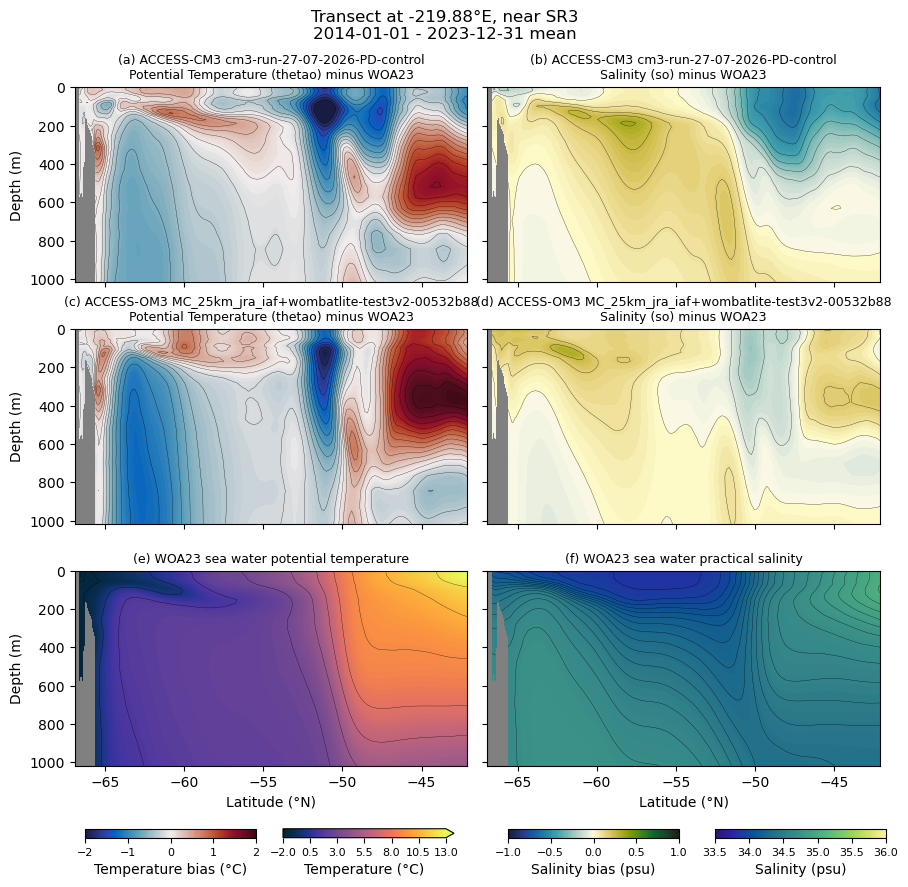

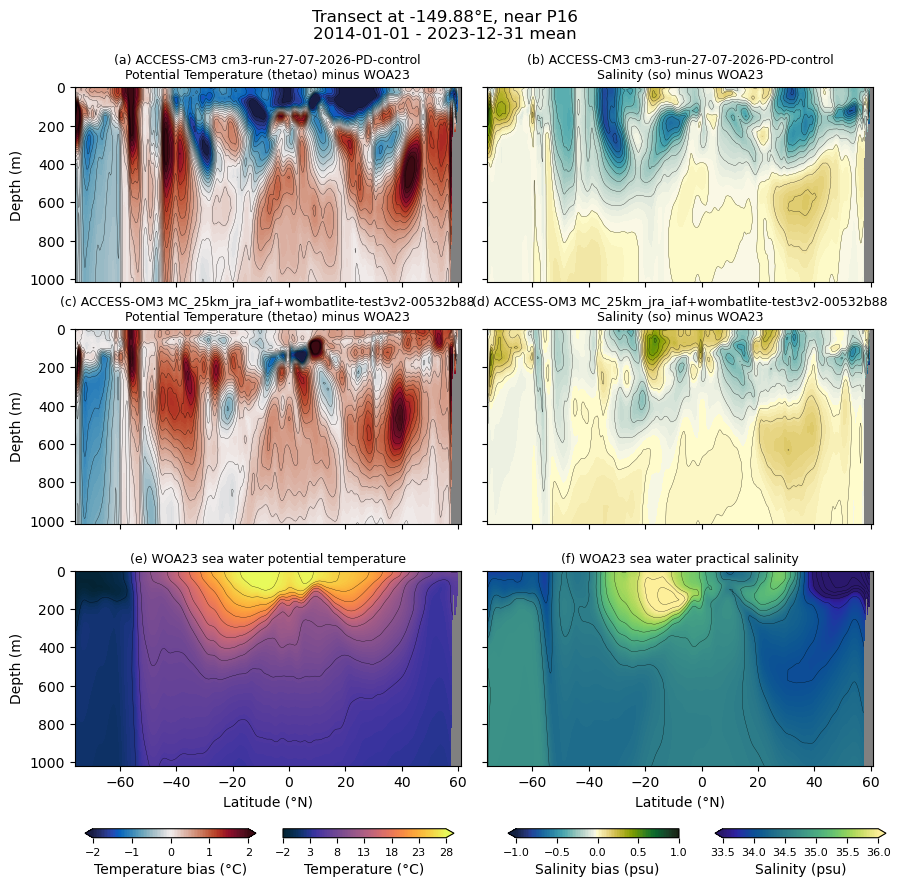

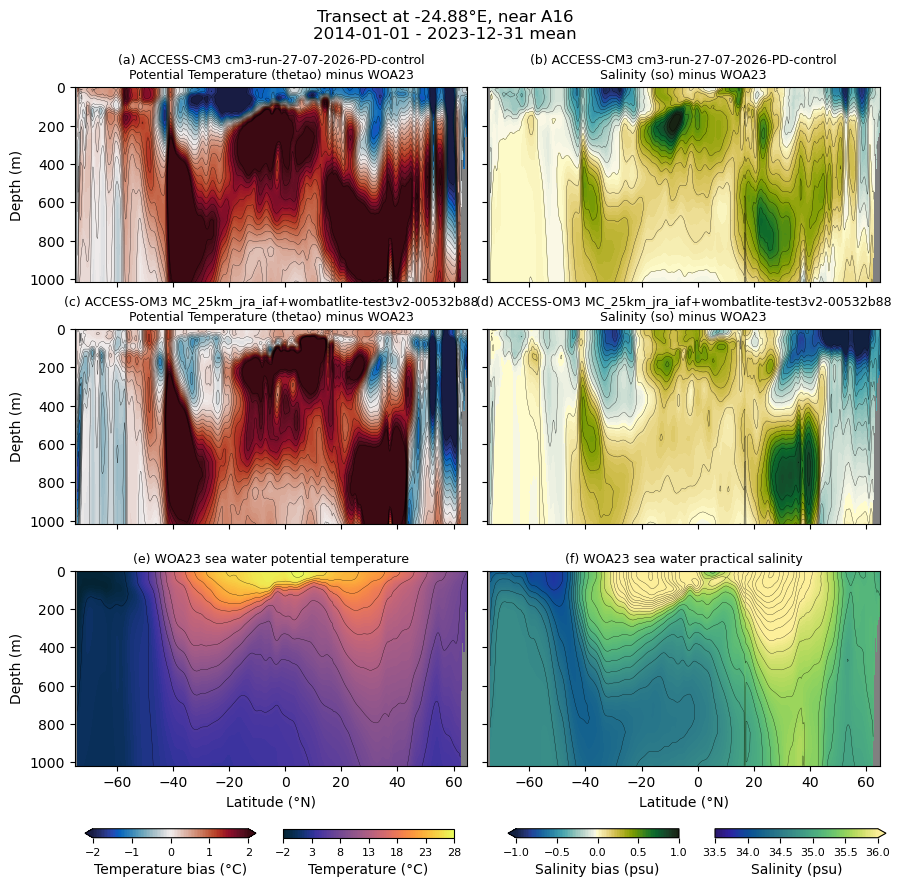

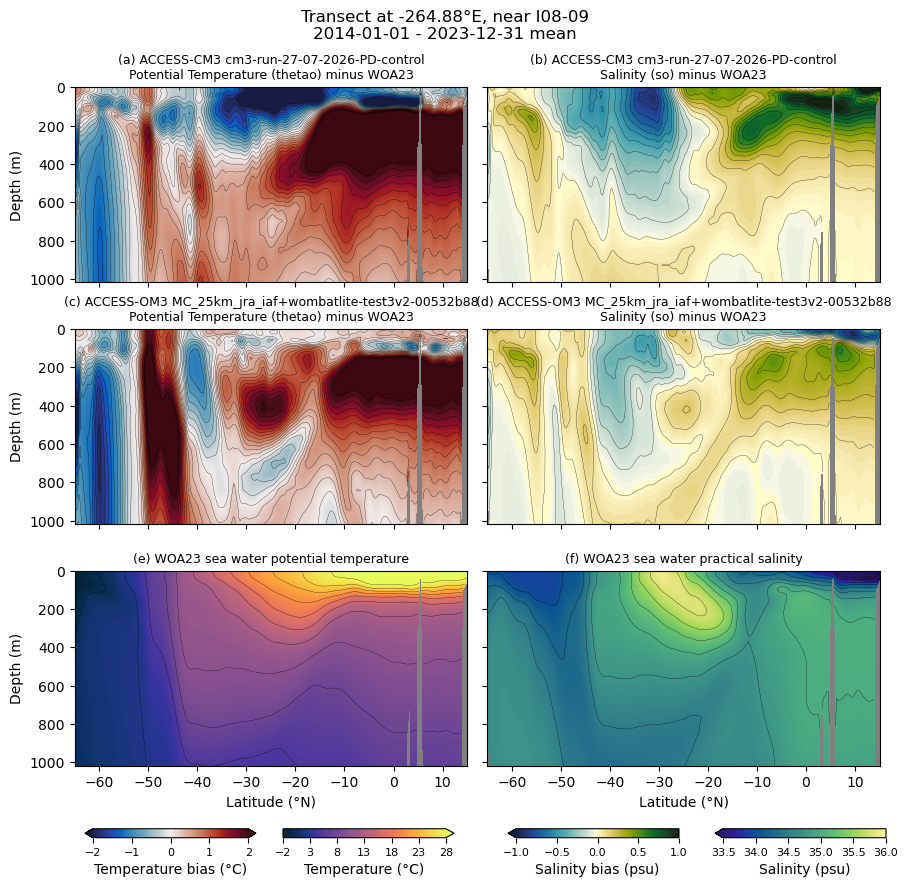

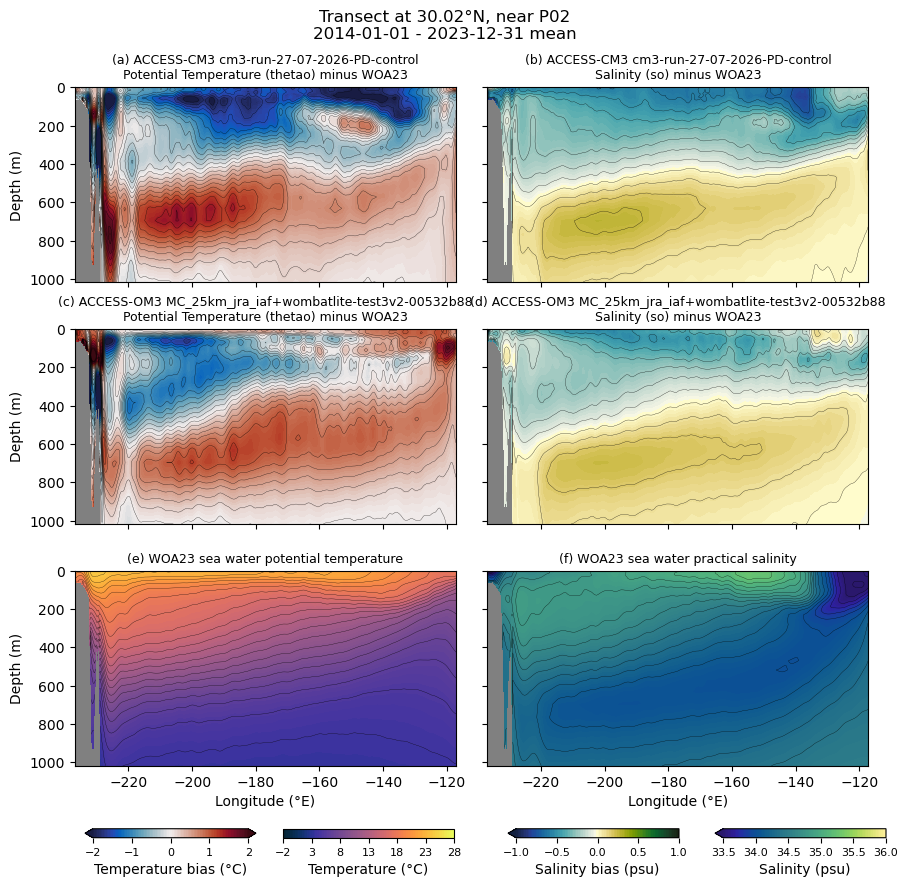

...

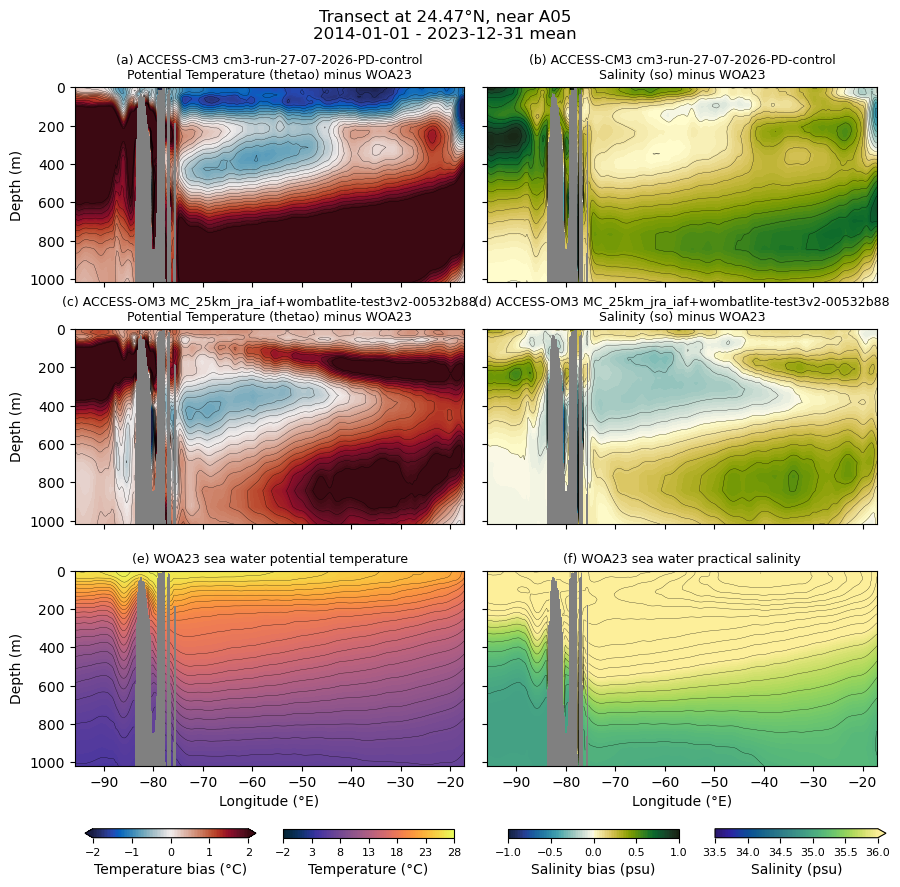

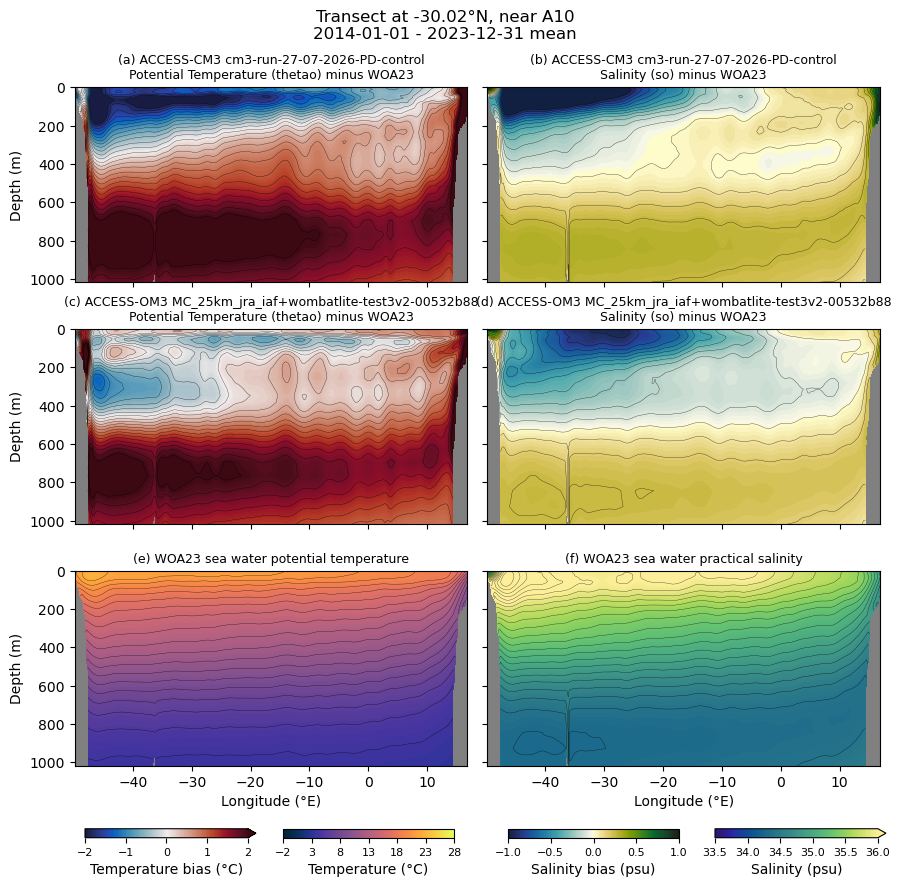

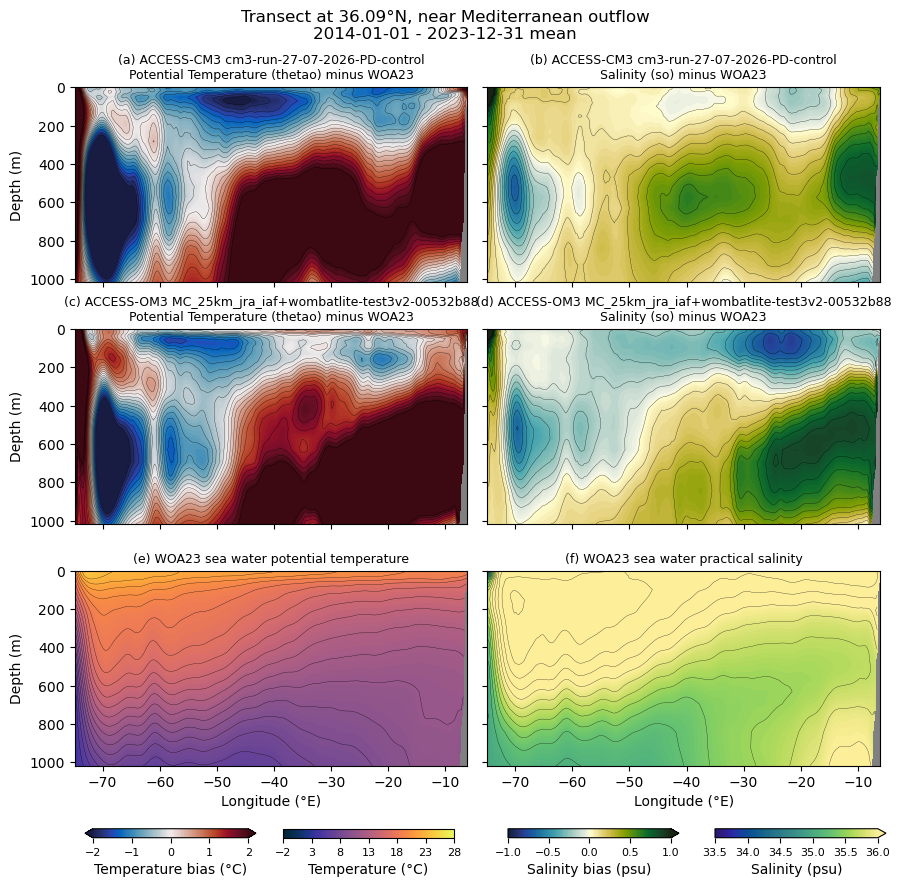

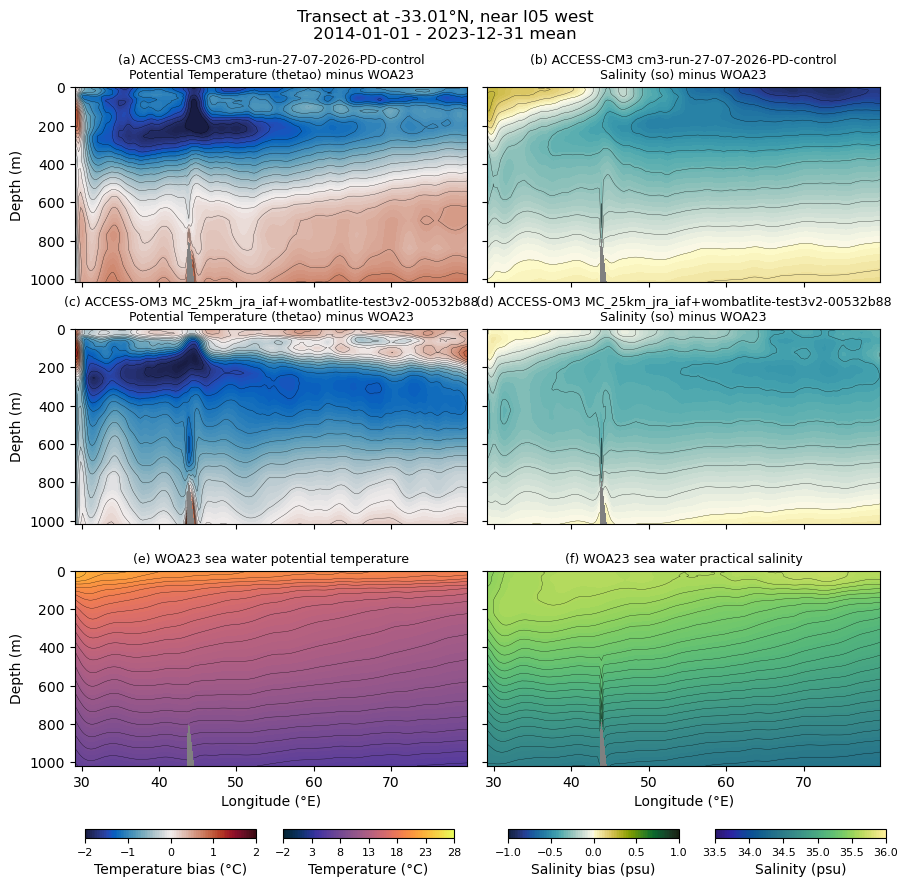

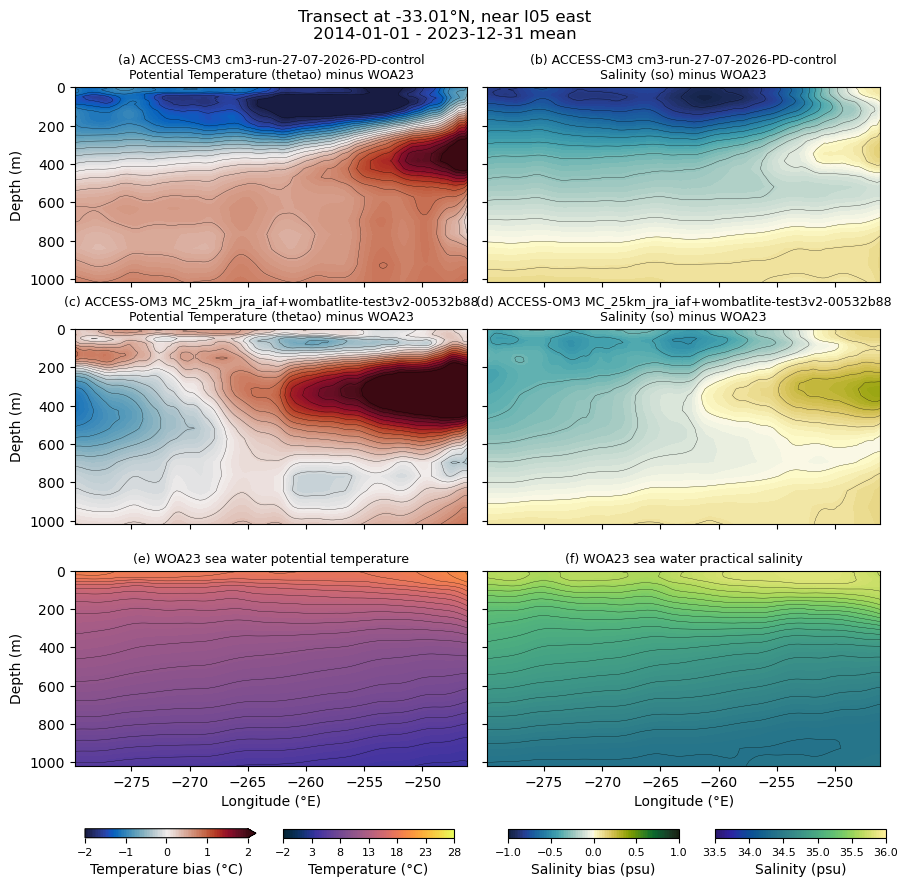

In [40]:
%%time
z_level_max = 47

for transect, (minx, maxx, miny, maxy) in transects.items():
    xsel = minx if minx == maxx else slice(minx, maxx)
    ysel = miny if miny == maxy else slice(miny, maxy)
    xmethod = "nearest" if minx == maxx else None
    ymethod = "nearest" if miny == maxy else None
    woa23variable = "ptemp"  # potential temperature
    woa13variable = "temp"  # potential temperature

    om3variable = "thetao"  # potential temperature

    npanels = 2 * (len(cm3data) + len(om3data) + 1)
    nrows = (npanels+1)//2
    fig, axs = plt.subplots(nrows, 2,
                            figsize=(9, 3*nrows),
                            sharex=True, sharey=True)
    fig.suptitle(f'Transect at {f"{minx:.2f}°E" if minx == maxx else f"{miny:.2f}°N"}, near {transect}\n{timerange.start.strftime("%Y-%m-%d")} - {timerange.stop.strftime("%Y-%m-%d")} mean', y=0.98)

    # Column 1: Temperature
    cmap = cmocean.cm.balance

    cm3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in cm3data.items()
    }
    
    om3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in om3data.items()
    }
    
    tlim = -1
    for da in cm3bias.values():
        tlim = max(tlim, da.max().data)
    for da in om3bias.values():
        tlim = max(tlim, da.max().data)

    tlim = 2 # to match Kiss et al 2020

    # ACCESS-CM3
    for i, (expt, da) in enumerate(cm3bias.items()):
        plt.subplot(nrows, 2, 2*i+1).set_facecolor('gray')  # gray land points
        p = da.plot.contourf(
            levels=101, vmin=-tlim, vmax=tlim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-tlim, vmax=tlim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i)}) ACCESS-CM3 {expt}\n{cm3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')
        plt.ylabel('Depth (m)')

    # ACCESS-OM3
    for i, (expt, da) in enumerate(om3bias.items(), start=i+1):
        plt.subplot(nrows, 2, 2*i+1).set_facecolor('gray')  # gray land points
        p1 = da.plot.contourf(
            levels=101, vmin=-tlim, vmax=tlim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-tlim, vmax=tlim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i)}) ACCESS-OM3 {expt}\n{om3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')
        plt.ylabel('Depth (m)')

    # WOA23
    i += 1
    cmap = cmocean.cm.thermal
    da = obsdata['woa23'][woa23variable].sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max))
    plt.subplot(nrows, 2, 2*i+1).set_facecolor('gray')  # gray land points
    p4 = da.plot.contourf(
        levels=101, cmap=cmap, add_colorbar=False,
        vmin=-2, vmax=13 if transect=='SR3' else 28  # to match Kiss et al 2020
    )
    da.plot.contour(
        levels=25, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
    )
    plt.gca().set_ylim([0, None])
    plt.gca().invert_yaxis()
    plt.title(f"({chr(ord('a')+2*i)}) WOA23 {da.attrs['standard_name'].replace('_', ' ')}", fontsize=9)
    plt.xlabel('Latitude (°N)' if minx == maxx else 'Longitude (°E)')
    plt.ylabel('Depth (m)')


    # Column 2: Salt
    om3variable = "so"
    woa23variable = "salt"
    cmap = cmocean.cm.delta

    cm3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in cm3data.items()
    }
    
    om3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in om3data.items()
    }

    # slim = -1
    # for da in om3bias.values():
    #     slim = max(slim, da.max().data)
    # for da in om2bias.values():
    #     slim = max(slim, da.max().data)

    slim = 1.0 # to match Kiss et al 2020

    # ACCESS-OM3
    for i, (expt, da) in enumerate(cm3bias.items()):
        plt.subplot(nrows, 2, 2*i+2).set_facecolor('gray')  # gray land points
        da.plot.contourf(
            levels=101, vmin=-slim, vmax=slim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-slim, vmax=slim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i+1)}) ACCESS-CM3 {expt}\n{cm3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')

    # ACCESS-OM2
    for i, (expt, da) in enumerate(om3bias.items(), start=i+1):
        plt.subplot(nrows, 2, 2*i+2).set_facecolor('gray')  # gray land points
        s1 = da.plot.contourf(
            levels=101, vmin=-slim, vmax=slim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-slim, vmax=slim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i+1)}) ACCESS-OM3 {expt}\n{om3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')

    # WOA23
    cmap = cmocean.cm.haline
    i += 1
    da = obsdata['woa23'][woa23variable].sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max))
    plt.subplot(nrows, 2, 2*i+2).set_facecolor('gray')  # gray land points
    s4 = da.plot.contourf(
        levels=101, cmap=cmap, add_colorbar=False,
        vmin=33.5, vmax=36  # to match Kiss et al 2020
    )
    da.plot.contour(
        levels=25, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
    )
    plt.gca().set_ylim([0, None])
    plt.gca().invert_yaxis()
    plt.title(f"({chr(ord('a')+2*i+1)}) WOA23 {da.attrs['standard_name'].replace('_', ' ')}", fontsize=9)
    plt.xlabel('Latitude (°N)' if minx == maxx else 'Longitude (°E)')

    for ax in fig.get_axes():
        ax.label_outer()
    plt.tight_layout()

# to match Kiss et al 2020 https://github.com/COSIMA/ACCESS-OM2-1-025-010deg-report/blob/master/figures/WOCE_transects/Plot_WOCE_transects.ipynb
    plt.subplots_adjust(bottom=0.14, hspace=0.24)
    
    ax1 = plt.axes([0.1,0.06,0.19,0.01])
    cb1 = plt.colorbar(p1, cax=ax1, orientation='horizontal', extend='both',
                       ticks=np.linspace(-tlim, tlim, 5))
    cb1.ax.xaxis.minorticks_off()
    cb1.ax.tick_params(labelsize=8)
    cb1.set_label('Temperature bias (°C)')
    
    ax2 = plt.axes([0.32,0.06,0.19,0.01])
    cb2 = plt.colorbar(p4, cax=ax2, orientation='horizontal', extend='both',
                       ticks=np.linspace(-2, 13 if transect=='SR3' else 28, 7))
    cb2.ax.xaxis.minorticks_off()
    cb2.ax.tick_params(labelsize=8)
    cb2.set_label('Temperature (°C)')
    
    ax3 = plt.axes([0.57,0.06,0.19,0.01])
    cb3 = plt.colorbar(s1, cax=ax3, orientation='horizontal', extend='both',
                       ticks=np.linspace(-slim, slim, 5))
    cb3.ax.xaxis.minorticks_off()
    cb3.ax.tick_params(labelsize=8)
    cb3.set_label('Salinity bias (psu)')
    
    ax4 = plt.axes([0.8,0.06,0.19,0.01])
    cb4 = plt.colorbar(s4, cax=ax4, orientation='horizontal', extend='both',
                       ticks=np.linspace(33.5, 36, 6))
    cb4.ax.xaxis.minorticks_off()
    cb4.ax.tick_params(labelsize=8)
    cb4.set_label('Salinity (psu)')
    # mkmd.savefig(fig, f"{transect} temperature and salinity transects", f"{transect} temperature and salinity bias of ACCESS-OM3 and ACCESS-OM2 relative to WOA")

## Plot transects

CPU times: user 37.6 s, sys: 26.7 s, total: 1min 4s
Wall time: 48.9 s


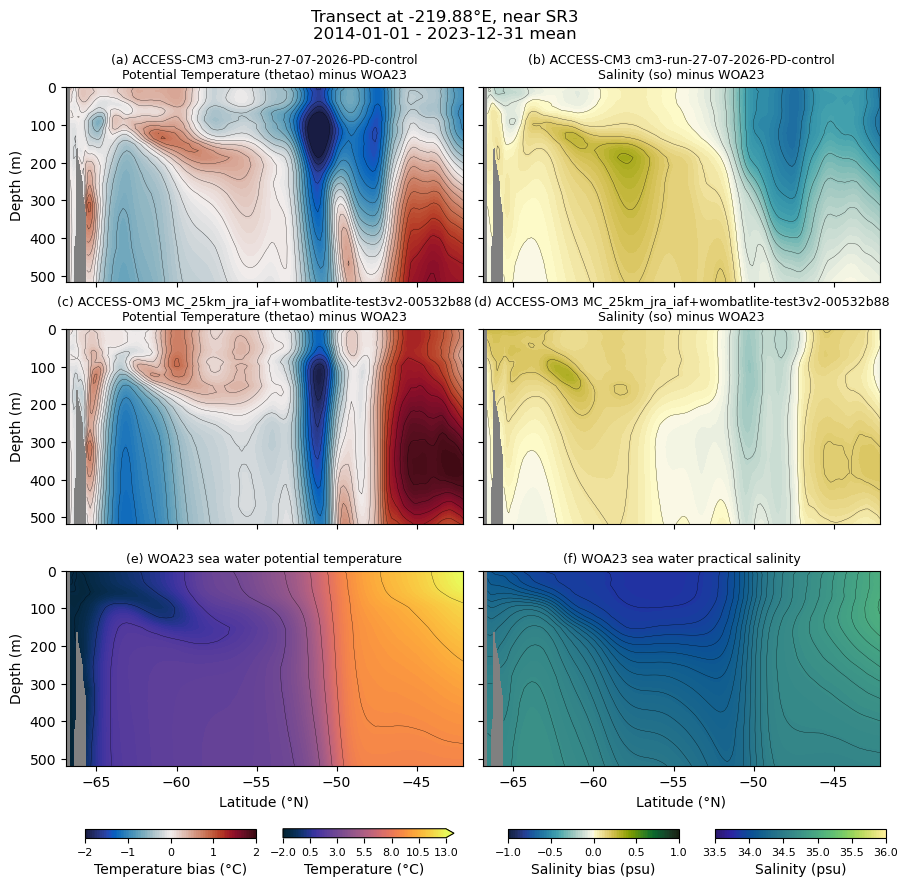

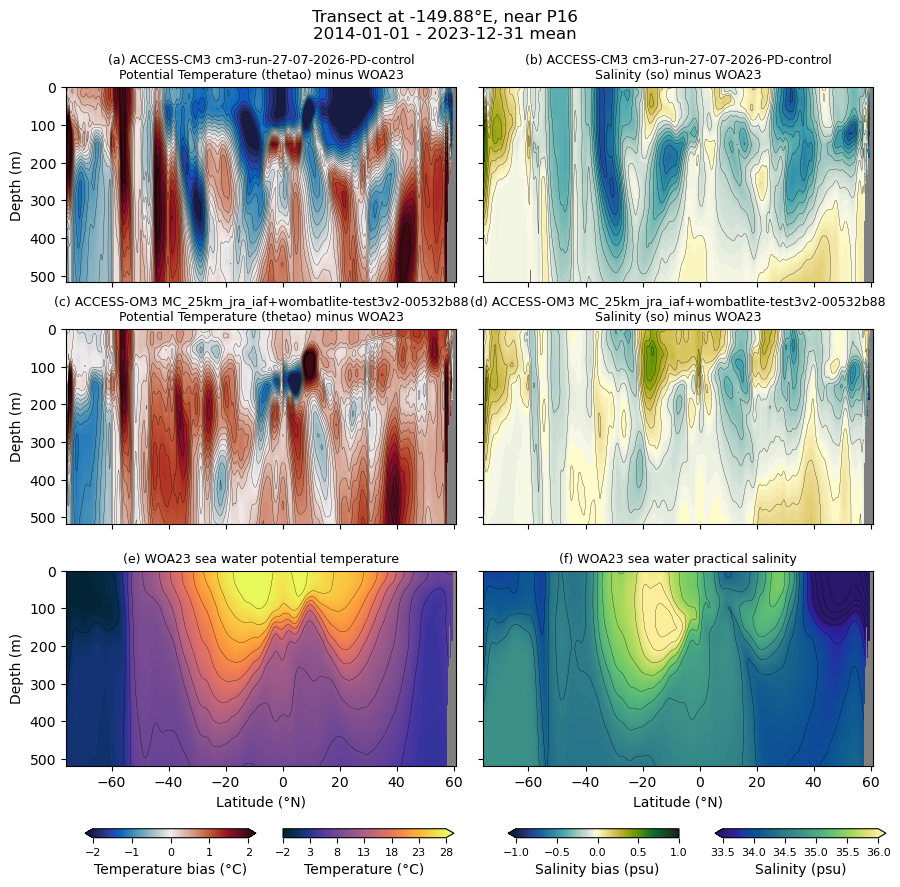

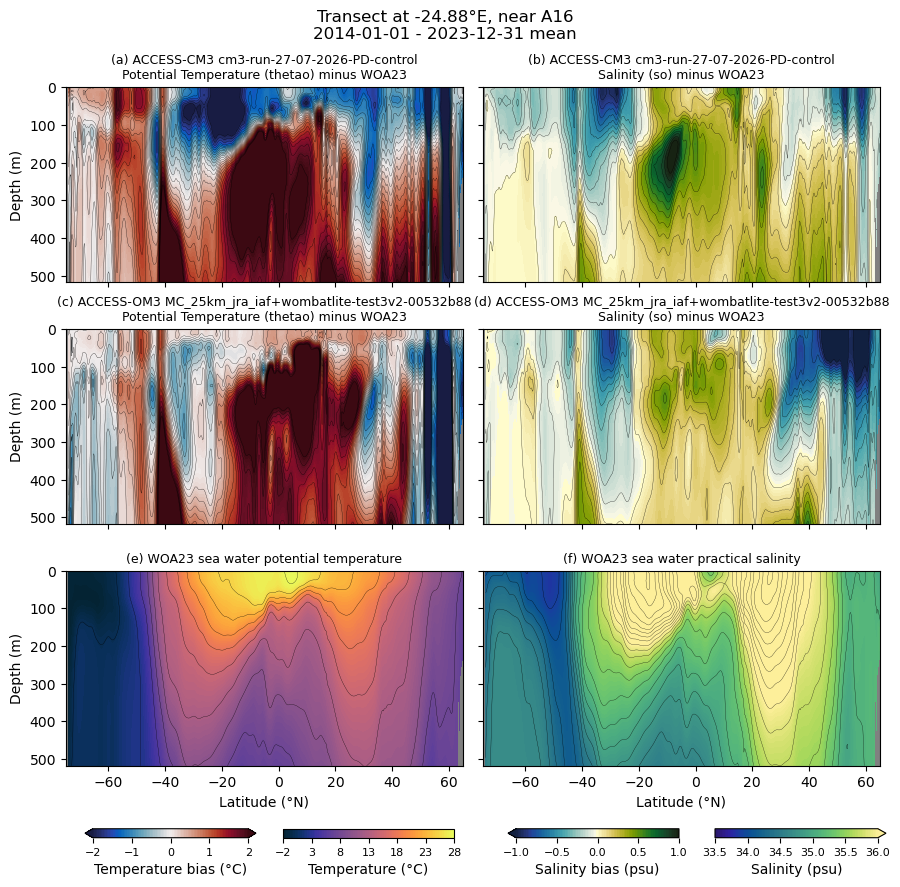

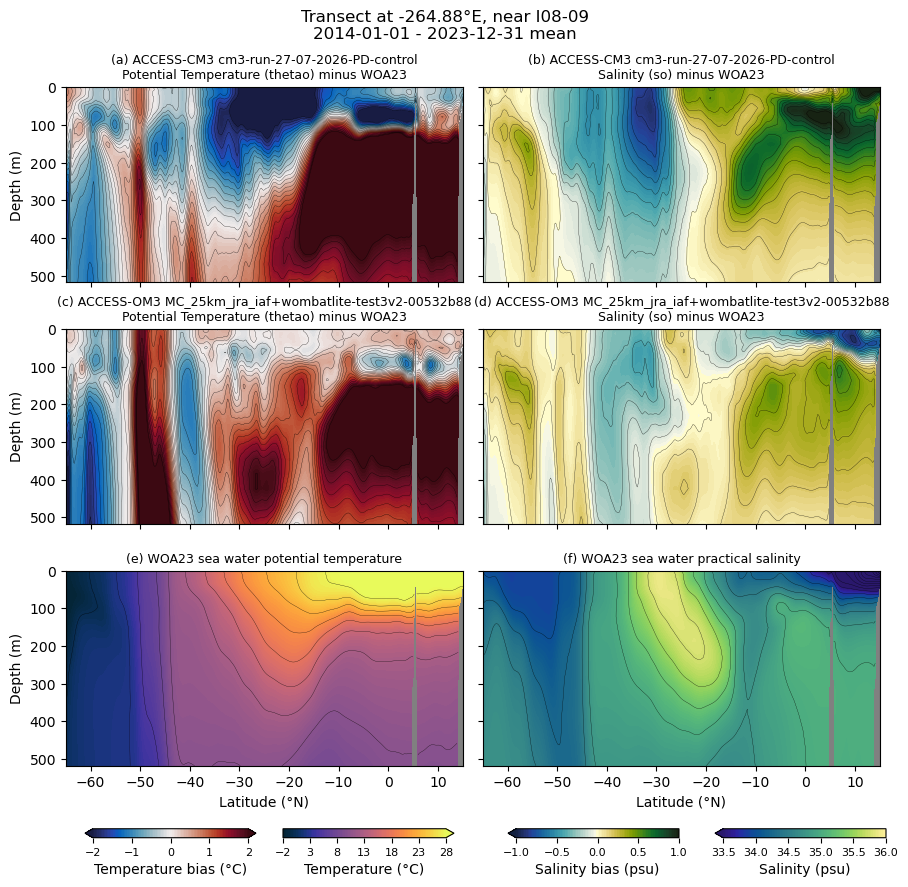

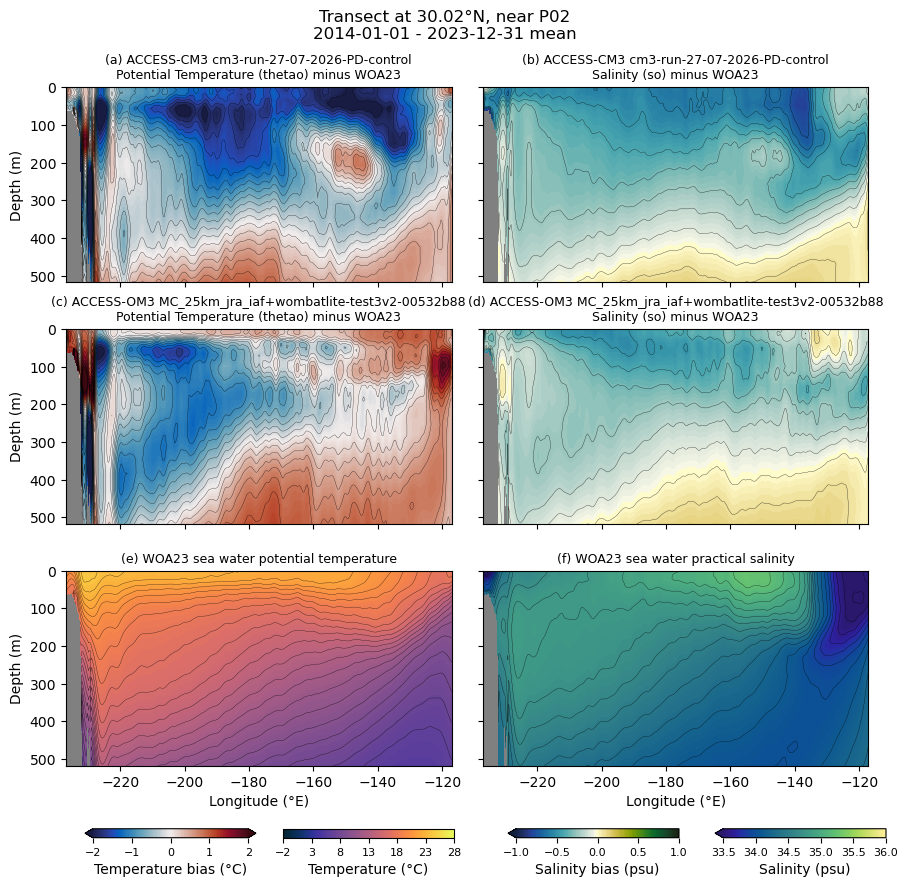

...

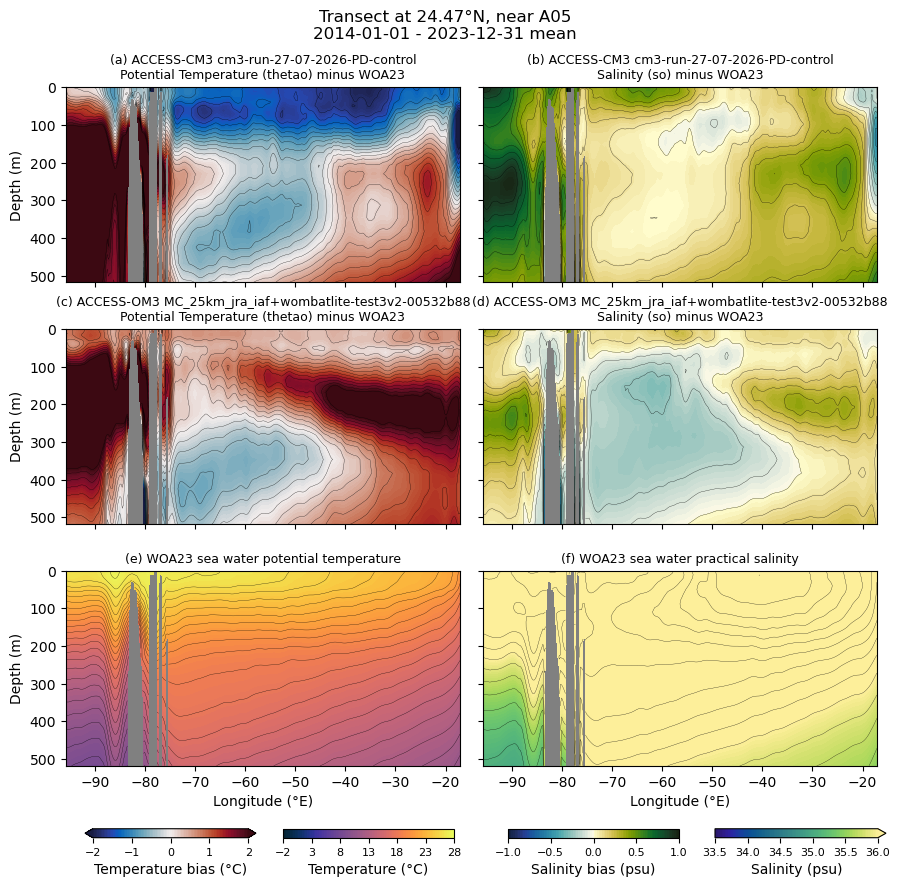

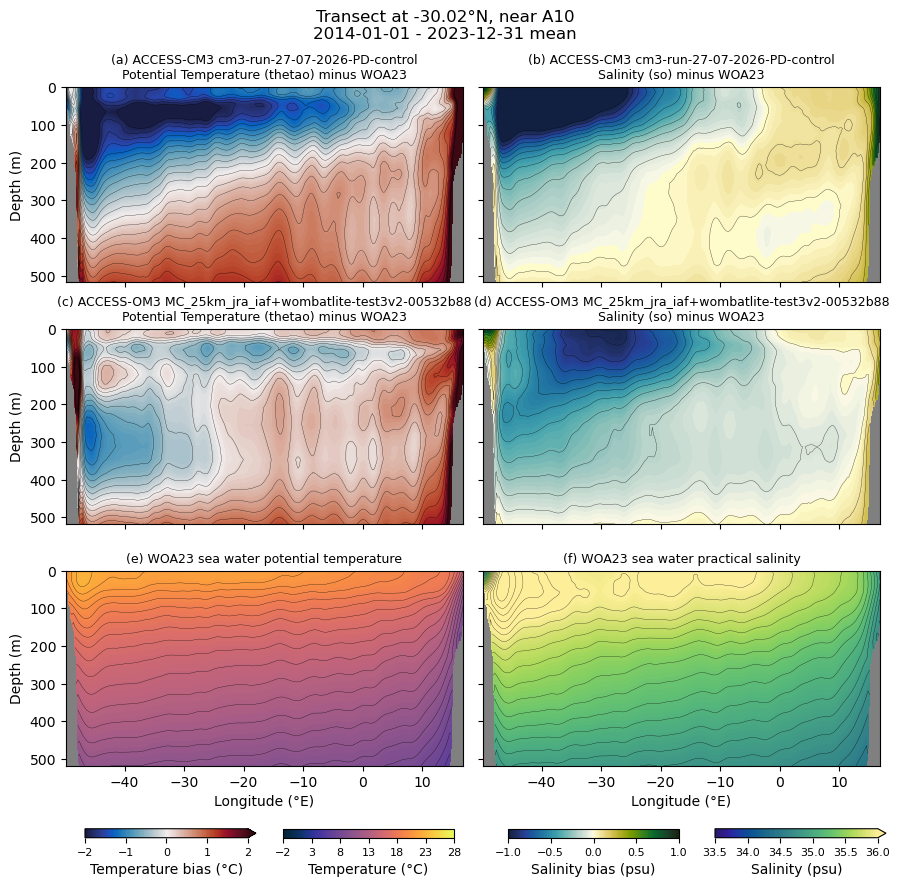

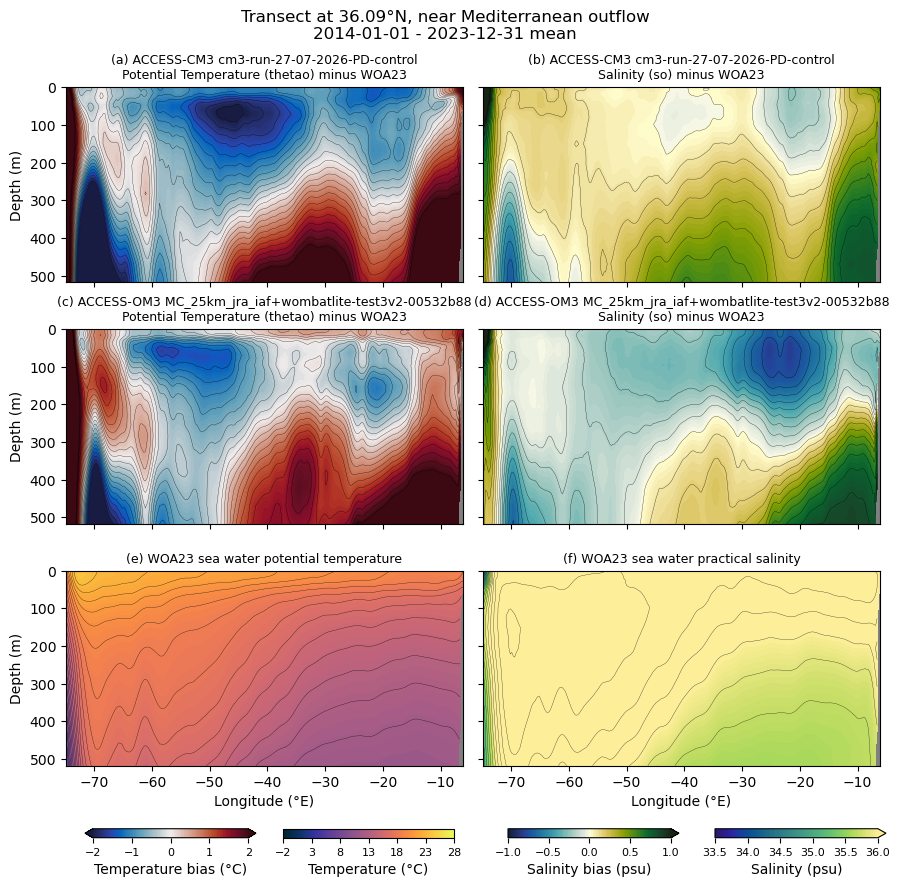

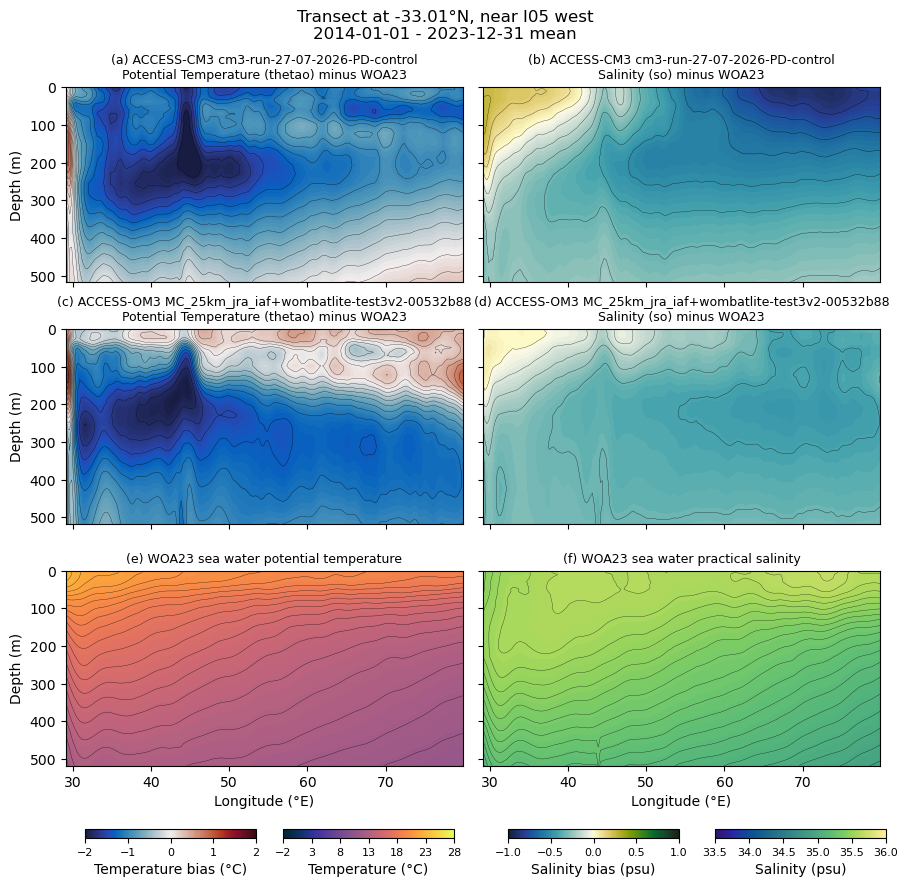

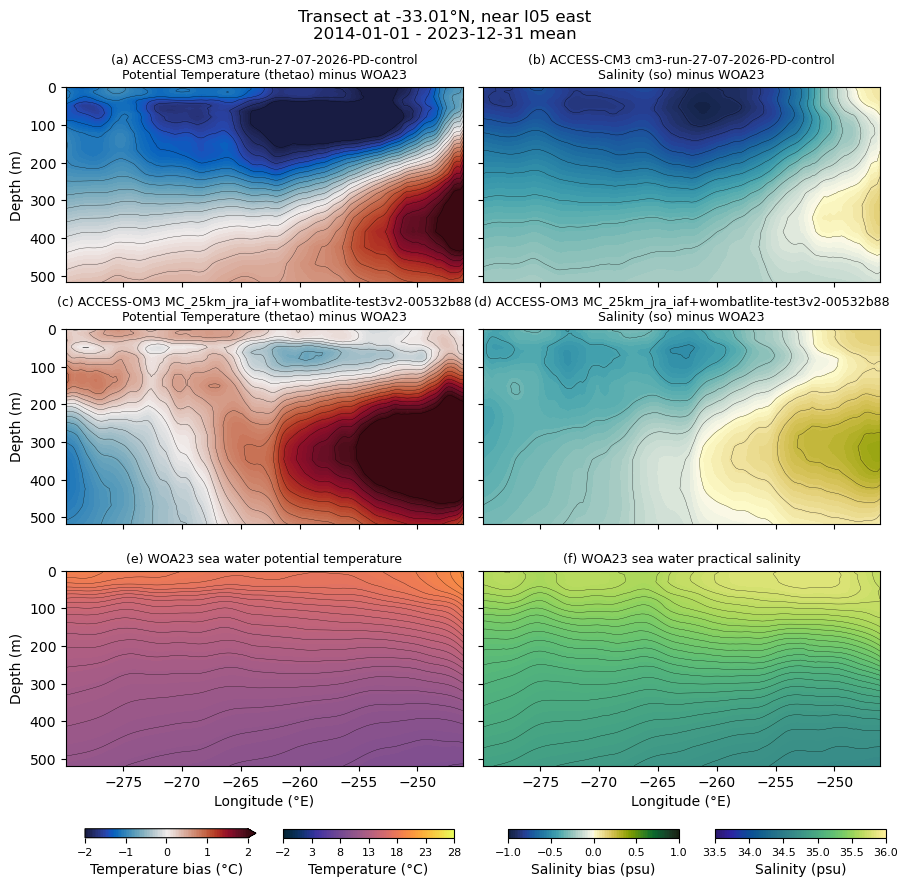

In [34]:
%%time
z_level_max = 40

for transect, (minx, maxx, miny, maxy) in transects.items():
    xsel = minx if minx == maxx else slice(minx, maxx)
    ysel = miny if miny == maxy else slice(miny, maxy)
    xmethod = "nearest" if minx == maxx else None
    ymethod = "nearest" if miny == maxy else None
    woa23variable = "ptemp"  # potential temperature
    woa13variable = "temp"  # potential temperature

    om3variable = "thetao"  # potential temperature

    npanels = 2 * (len(cm3data) + len(om3data) + 1)
    nrows = (npanels+1)//2
    fig, axs = plt.subplots(nrows, 2,
                            figsize=(9, 3*nrows),
                            sharex=True, sharey=True)
    fig.suptitle(f'Transect at {f"{minx:.2f}°E" if minx == maxx else f"{miny:.2f}°N"}, near {transect}\n{timerange.start.strftime("%Y-%m-%d")} - {timerange.stop.strftime("%Y-%m-%d")} mean', y=0.98)

    # Column 1: Temperature
    cmap = cmocean.cm.balance

    cm3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in cm3data.items()
    }
    
    om3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in om3data.items()
    }
    
    tlim = -1
    for da in cm3bias.values():
        tlim = max(tlim, da.max().data)
    for da in om3bias.values():
        tlim = max(tlim, da.max().data)

    tlim = 2 # to match Kiss et al 2020

    # ACCESS-CM3
    for i, (expt, da) in enumerate(cm3bias.items()):
        plt.subplot(nrows, 2, 2*i+1).set_facecolor('gray')  # gray land points
        p = da.plot.contourf(
            levels=101, vmin=-tlim, vmax=tlim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-tlim, vmax=tlim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i)}) ACCESS-CM3 {expt}\n{cm3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')
        plt.ylabel('Depth (m)')

    # ACCESS-OM3
    for i, (expt, da) in enumerate(om3bias.items(), start=i+1):
        plt.subplot(nrows, 2, 2*i+1).set_facecolor('gray')  # gray land points
        p1 = da.plot.contourf(
            levels=101, vmin=-tlim, vmax=tlim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-tlim, vmax=tlim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i)}) ACCESS-OM3 {expt}\n{om3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')
        plt.ylabel('Depth (m)')

    # WOA23
    i += 1
    cmap = cmocean.cm.thermal
    da = obsdata['woa23'][woa23variable].sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max))
    plt.subplot(nrows, 2, 2*i+1).set_facecolor('gray')  # gray land points
    p4 = da.plot.contourf(
        levels=101, cmap=cmap, add_colorbar=False,
        vmin=-2, vmax=13 if transect=='SR3' else 28  # to match Kiss et al 2020
    )
    da.plot.contour(
        levels=25, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
    )
    plt.gca().set_ylim([0, None])
    plt.gca().invert_yaxis()
    plt.title(f"({chr(ord('a')+2*i)}) WOA23 {da.attrs['standard_name'].replace('_', ' ')}", fontsize=9)
    plt.xlabel('Latitude (°N)' if minx == maxx else 'Longitude (°E)')
    plt.ylabel('Depth (m)')


    # Column 2: Salt
    om3variable = "so"
    woa23variable = "salt"
    cmap = cmocean.cm.delta

    cm3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in cm3data.items()
    }
    
    om3bias = {
        expt: (
            ds[om3variable] - obsdata['woa23'][woa23variable]
        ).sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max)).load()
        for expt, ds in om3data.items()
    }

    # slim = -1
    # for da in om3bias.values():
    #     slim = max(slim, da.max().data)
    # for da in om2bias.values():
    #     slim = max(slim, da.max().data)

    slim = 1.0 # to match Kiss et al 2020

    # ACCESS-OM3
    for i, (expt, da) in enumerate(cm3bias.items()):
        plt.subplot(nrows, 2, 2*i+2).set_facecolor('gray')  # gray land points
        da.plot.contourf(
            levels=101, vmin=-slim, vmax=slim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-slim, vmax=slim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i+1)}) ACCESS-CM3 {expt}\n{cm3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')

    # ACCESS-OM2
    for i, (expt, da) in enumerate(om3bias.items(), start=i+1):
        plt.subplot(nrows, 2, 2*i+2).set_facecolor('gray')  # gray land points
        s1 = da.plot.contourf(
            levels=101, vmin=-slim, vmax=slim, cmap=cmap, add_colorbar=False,
        )
        da.plot.contour(
            levels=25, vmin=-slim, vmax=slim, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
        )
        plt.gca().set_ylim([0, None])
        plt.gca().invert_yaxis()
        plt.title(f"({chr(ord('a')+2*i+1)}) ACCESS-OM3 {expt}\n{om3data[expt][om3variable].attrs['long_name']} ({om3variable}) minus WOA23", fontsize=9)
        plt.xlabel('')

    # WOA23
    cmap = cmocean.cm.haline
    i += 1
    da = obsdata['woa23'][woa23variable].sel(xh=xsel, method=xmethod).sel(yh=ysel, method=ymethod).isel(z_l=slice(0, z_level_max))
    plt.subplot(nrows, 2, 2*i+2).set_facecolor('gray')  # gray land points
    s4 = da.plot.contourf(
        levels=101, cmap=cmap, add_colorbar=False,
        vmin=33.5, vmax=36  # to match Kiss et al 2020
    )
    da.plot.contour(
        levels=25, add_colorbar=False, colors=["k"], linewidths=[0.2], linestyles=["-"]
    )
    plt.gca().set_ylim([0, None])
    plt.gca().invert_yaxis()
    plt.title(f"({chr(ord('a')+2*i+1)}) WOA23 {da.attrs['standard_name'].replace('_', ' ')}", fontsize=9)
    plt.xlabel('Latitude (°N)' if minx == maxx else 'Longitude (°E)')

    for ax in fig.get_axes():
        ax.label_outer()
    plt.tight_layout()

# to match Kiss et al 2020 https://github.com/COSIMA/ACCESS-OM2-1-025-010deg-report/blob/master/figures/WOCE_transects/Plot_WOCE_transects.ipynb
    plt.subplots_adjust(bottom=0.14, hspace=0.24)
    
    ax1 = plt.axes([0.1,0.06,0.19,0.01])
    cb1 = plt.colorbar(p1, cax=ax1, orientation='horizontal', extend='both',
                       ticks=np.linspace(-tlim, tlim, 5))
    cb1.ax.xaxis.minorticks_off()
    cb1.ax.tick_params(labelsize=8)
    cb1.set_label('Temperature bias (°C)')
    
    ax2 = plt.axes([0.32,0.06,0.19,0.01])
    cb2 = plt.colorbar(p4, cax=ax2, orientation='horizontal', extend='both',
                       ticks=np.linspace(-2, 13 if transect=='SR3' else 28, 7))
    cb2.ax.xaxis.minorticks_off()
    cb2.ax.tick_params(labelsize=8)
    cb2.set_label('Temperature (°C)')
    
    ax3 = plt.axes([0.57,0.06,0.19,0.01])
    cb3 = plt.colorbar(s1, cax=ax3, orientation='horizontal', extend='both',
                       ticks=np.linspace(-slim, slim, 5))
    cb3.ax.xaxis.minorticks_off()
    cb3.ax.tick_params(labelsize=8)
    cb3.set_label('Salinity bias (psu)')
    
    ax4 = plt.axes([0.8,0.06,0.19,0.01])
    cb4 = plt.colorbar(s4, cax=ax4, orientation='horizontal', extend='both',
                       ticks=np.linspace(33.5, 36, 6))
    cb4.ax.xaxis.minorticks_off()
    cb4.ax.tick_params(labelsize=8)
    cb4.set_label('Salinity (psu)')
    # mkmd.savefig(fig, f"{transect} temperature and salinity transects", f"{transect} temperature and salinity bias of ACCESS-OM3 and ACCESS-OM2 relative to WOA")

In [22]:
client.close()

2026-08-25 12:06:26,558 - distributed.worker - ERROR - Failed to communicate with scheduler during heartbeat.
Traceback (most recent call last):
  File "/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/distributed/comm/tcp.py", line 226, in read
    frames_nosplit_nbytes_bin = await stream.read_bytes(fmt_size)
                                ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
tornado.iostream.StreamClosedError: Stream is closed

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/distributed/worker.py", line 1273, in heartbeat
    response = await retry_operation(
               ^^^^^^^^^^^^^^^^^^^^^^
  File "/g/data/xp65/public/apps/med_conda/envs/analysis3-26.07/lib/python3.12/site-packages/distributed/utils_comm.py", line 416, in retry_operation
    return await retry(
           ^^^^^^^^^^^^
  File "/g/d